In [1]:
# import os
# from PIL import Image

# # Define the main folder containing subfolders with JPG files
# main_folder = "Curated Dataset"

# # List of subfolder names
# subfolders = ["Normal", "COVID-19", "Pneumonia-Bacterial", "Pneumonia-Viral"]

# # Loop through each subfolder
# for subfolder in subfolders:
#     folder_path = os.path.join(main_folder, subfolder)
    
#     # Check if the folder exists
#     if os.path.exists(folder_path):
#         # Get a list of JPG files in the subfolder
#         jpg_files = [f for f in os.listdir(folder_path) if f.endswith(".jpg")]
        
#         # Loop through each JPG file and convert to PNG
#         for jpg_file in jpg_files:
#             jpg_path = os.path.join(folder_path, jpg_file)
#             png_file = os.path.splitext(jpg_file)[0] + ".png"
#             png_path = os.path.join(folder_path, png_file)
            
#             # Open and convert the image
#             try:
#                 img = Image.open(jpg_path)
#                 img.save(png_path, "PNG")
#                 print(f"Converted {jpg_file} to {png_file}")
#             except Exception as e:
#                 print(f"Error converting {jpg_file}: {str(e)}")
#     else:
#         print(f"Folder '{subfolder}' not found in '{main_folder}'")

In [1]:
from platform import python_version

print(python_version())

3.9.12


In [2]:
import tensorflow as tf
tf.__version__

2023-10-09 17:09:25.402632: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-09 17:09:26.578976: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


'2.13.0'

In [3]:
import os
import random
import warnings

import cv2
import gdown
from functools import partial

warnings.simplefilter(action="ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"

import numpy as np
import pandas as pd
from matplotlib import cm
from numpy.random import rand
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend
from tensorflow.keras import layers

physical_devices = tf.config.list_physical_devices("GPU")
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
#     tf.config.optimizer.set_jit(True)
    keras.mixed_precision.set_global_policy("mixed_float16")
except:
    pass

seed = 1337
tf.random.set_seed(seed)

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: Quadro GV100, compute capability 7.0


In [5]:
# os.environ['XLA_FLAGS'] = "--xla_gpu_cuda_data_dir=/anaconda_path/envs/env/lib/libdevice.10.bc"

In [4]:
def get_model_weight(model_id):
    """Get the trained weights."""
    if not os.path.exists("model.h5"):
        model_weight = gdown.download(id=model_id, quiet=False)
    else:
        model_weight = "model.h5"
    return model_weight


def get_model_history(history_id):
    """Get the history / log file."""
    if not os.path.exists("history.csv"):
        history_file = gdown.download(id=history_id, quiet=False)
    else:
        history_file = "history.csv"
    return history_file


def make_plot(tfdata, take_batch=1, title=True, figsize=(20, 20)):
    """ref: https://gist.github.com/innat/4dc4080cfdf5cf20ef0fc93d3623ca9b"""

    font = {
        "family": "serif",
        "color": "darkred",
        "weight": "normal",
        "size": 18,
    }

    for images, labels in tfdata.take(take_batch):
        plt.figure(figsize=figsize)
        xy = int(np.ceil(images.shape[0] * 0.5))

        for i in range(images.shape[0]):
            plt.subplot(xy, xy, i + 1)
            plt.imshow(tf.cast(images[i], dtype=tf.uint8))
            if title:
                plt.title(tcls_names[tf.argmax(labels[i], axis=-1)], fontdict=font)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

In [5]:
import pathlib

In [6]:
data_dir = "Curated Dataset"
data_dir = pathlib.Path(data_dir)
image_count = len(list(data_dir.glob('*/*.png')))
image_count

9194

In [7]:
class Parameters:
    # data level
    image_size = 192
    batch_size = 8
    num_grad_accumulation = 8
    label_smooth=0.05
    class_number = 4
    val_split = 0.2 
    verbosity = 1
    autotune = tf.data.AUTOTUNE
    
    # hparams
    epochs = 20
    lr_sched = 'cosine_restart' # [or, exponential, cosine, linear, constant]
    lr_base  = 0.016
    lr_min   = 0
    lr_decay_epoch  = 2.4
    lr_warmup_epoch = 5
    lr_decay_factor = 0.97
    
    scaled_lr = lr_base * (batch_size / 256.0)
    scaled_lr_min = lr_min * (batch_size / 256.0)
    num_validation_sample = int(image_count * val_split)
    num_training_sample = image_count - num_validation_sample
    train_step = int(np.ceil(num_training_sample / float(batch_size)))
    total_steps = train_step * epochs

params = Parameters()

In [8]:
train_set = keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=params.val_split,
    subset="training",
    label_mode='categorical',
    seed=params.image_size,
    image_size=(params.image_size, params.image_size),
    batch_size=params.batch_size,
)

val_set = keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=params.val_split,
    subset="validation",
    label_mode='categorical',
    seed=params.image_size,
    image_size=(params.image_size, params.image_size),
    batch_size=params.batch_size,
)

tcls_names, vcls_names = train_set.class_names , val_set.class_names
tcls_names, vcls_names 

Found 9194 files belonging to 4 classes.
Using 7356 files for training.


2023-10-09 17:10:21.160276: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30309 MB memory:  -> device: 0, name: Quadro GV100, pci bus id: 0000:65:00.0, compute capability: 7.0


Found 9194 files belonging to 4 classes.
Using 1838 files for validation.


(['COVID-19', 'Normal', 'Pneumonia-Bacterial', 'Pneumonia-Viral'],
 ['COVID-19', 'Normal', 'Pneumonia-Bacterial', 'Pneumonia-Viral'])

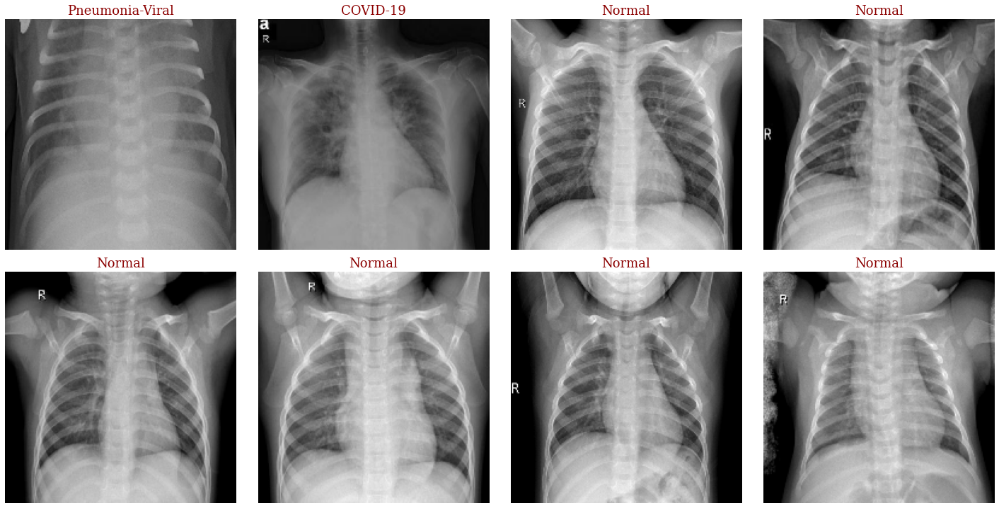

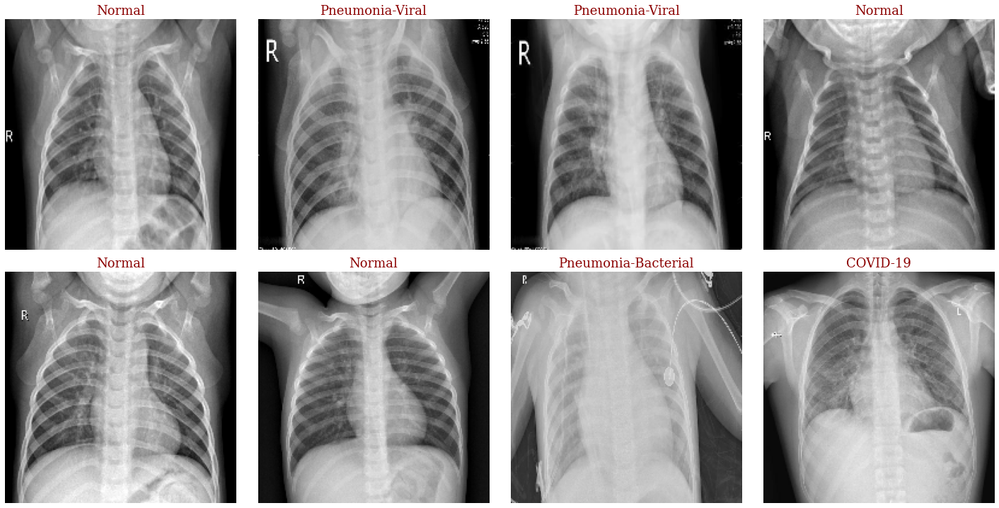

In [9]:
make_plot(train_set, take_batch=1, title=True) 
make_plot(val_set, take_batch=1, title=True) 

In [10]:
class RandomApply(layers.Layer):
    """RandomApply will randomly apply the transformation layer
    based on the given probability.
    
    Ref. https://stackoverflow.com/a/72558994/9215780
    """

    def __init__(self, layer, probability, **kwargs):
        super().__init__(**kwargs)
        self.layer = layer
        self.probability = probability

    def call(self, inputs, training=True):
        
        apply_layer = tf.random.uniform([]) < self.probability
        
        outputs = tf.cond(
            pred = tf.logical_and(apply_layer, training),
            true_fn = lambda: self.layer(inputs),
            false_fn = lambda: inputs,
        )
        return outputs

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "layer": layers.serialize(self.layer),
                "probability": self.probability,
            }
        )
        return config

In [11]:
class MixUp(layers.Layer):
    """Original implementation: https://github.com/keras-team/keras-cv.
    The original implementaiton provide more interface to apply mixup on
    various CV related task, i.e. object detection etc. It also provides
    many effective validation check.

    Derived and modified for simpler usages: M.Innat.
    Ref. https://gist.github.com/innat/0ee2b6155d663aac2617fe596e1d8d49
    """

    def __init__(self, alpha=0.2, seed=None, **kwargs):
        super().__init__(**kwargs)
        self.alpha = alpha
        self.seed = seed

    @staticmethod
    def _sample_from_beta(alpha, beta, shape):
        
        sample_alpha = tf.random.gamma(shape, 1.0, beta=alpha)
        sample_beta = tf.random.gamma(shape, 1.0, beta=beta)
        
        return sample_alpha / (sample_alpha + sample_beta)

    def _mixup_samples(self, images):
        batch_size = tf.shape(images)[0]
        permutation_order = tf.random.shuffle(tf.range(0, batch_size), seed=self.seed)

        lambda_sample = MixUp._sample_from_beta(self.alpha, self.alpha, (batch_size,))
        lambda_sample = tf.reshape(lambda_sample, [-1, 1, 1, 1])

        mixup_images = tf.gather(images, permutation_order)
        images = lambda_sample * images + (1.0 - lambda_sample) * mixup_images

        return images, tf.squeeze(lambda_sample), permutation_order

    def _mixup_labels(self, labels, lambda_sample, permutation_order):
        labels_for_mixup = tf.gather(labels, permutation_order)

        lambda_sample = tf.reshape(lambda_sample, [-1, 1])
        labels = lambda_sample * labels + (1.0 - lambda_sample) * labels_for_mixup

        return labels

    def call(self, batch_inputs):
        bs_images = tf.cast(batch_inputs[0], dtype=tf.float32)  
        bs_labels = tf.cast(batch_inputs[1], dtype=tf.float32)  

        mixup_images, lambda_sample, permutation_order = self._mixup_samples(bs_images)
        mixup_labels = self._mixup_labels(bs_labels, lambda_sample, permutation_order)

        return [mixup_images, mixup_labels]

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "alpha": self.alpha,
                "seed": self.seed,
            }
        )
        return config

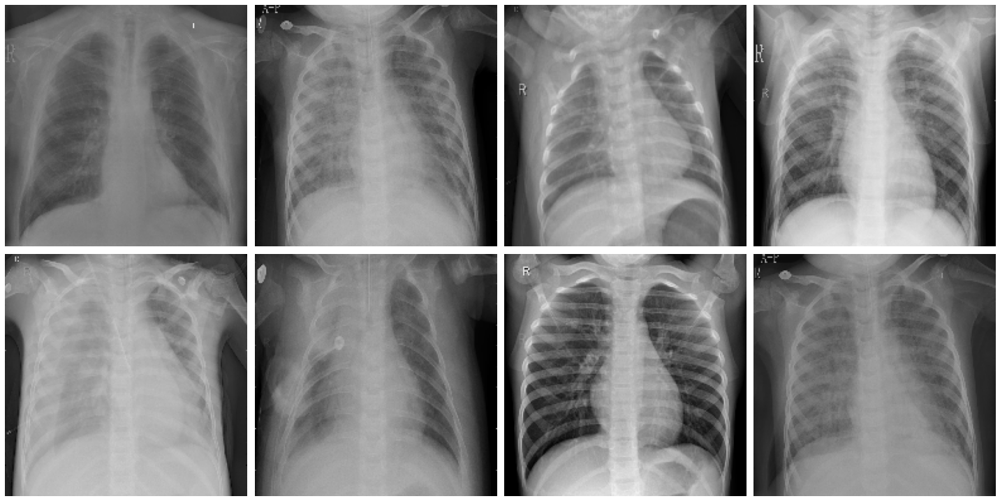

In [12]:
temp_ds = train_set.map(
    lambda x, y: MixUp()([x, y]), num_parallel_calls=params.autotune
)
make_plot(temp_ds, take_batch=1, title=False) 

In [13]:
class CutMix(layers.Layer):
    """Original implementation: https://github.com/keras-team/keras-cv.
    The original implementaiton provide more interface to apply mixup on
    various CV related task, i.e. object detection etc. It also provides
    many effective validation check.
    
    Derived and modified for simpler usages: M.Innat.
    Ref. https://gist.github.com/innat/0524ee77de17f0601f0dee69aa52c713
    """

    def __init__(self, alpha=1.0, seed=None, **kwargs):
        super().__init__(**kwargs)
        self.alpha = alpha
        self.seed = seed

    @staticmethod
    def _sample_from_beta(alpha, beta, shape):
        sample_alpha = tf.random.gamma(shape, 1.0, beta=alpha)
        sample_beta = tf.random.gamma(shape, 1.0, beta=beta)
        return sample_alpha / (sample_alpha + sample_beta)

    def _cutmix_labels(self, labels, lambda_sample, permutation_order):
        cutout_labels = tf.gather(labels, permutation_order)

        lambda_sample = tf.reshape(lambda_sample, [-1, 1])
        labels = lambda_sample * labels + (1.0 - lambda_sample) * cutout_labels
        return labels

    def _cutmix_samples(self, images):
        input_shape = tf.shape(images)
        batch_size, image_height, image_width = (
            input_shape[0],
            input_shape[1],
            input_shape[2],
        )

        permutation_order = tf.random.shuffle(tf.range(0, batch_size), seed=self.seed)
        lambda_sample = CutMix._sample_from_beta(self.alpha, self.alpha, (batch_size,))

        ratio = tf.math.sqrt(1 - lambda_sample)

        cut_height = tf.cast(
            ratio * tf.cast(image_height, dtype=tf.float32), dtype=tf.int32
        )
        cut_width = tf.cast(
            ratio * tf.cast(image_height, dtype=tf.float32), dtype=tf.int32
        )

        random_center_height = tf.random.uniform(
            shape=[batch_size], minval=0, maxval=image_height, dtype=tf.int32
        )
        random_center_width = tf.random.uniform(
            shape=[batch_size], minval=0, maxval=image_width, dtype=tf.int32
        )

        bounding_box_area = cut_height * cut_width
        lambda_sample = 1.0 - bounding_box_area / (image_height * image_width)
        lambda_sample = tf.cast(lambda_sample, dtype=tf.float32)

        images = self.fill_rectangle(
            images,
            random_center_width,
            random_center_height,
            cut_width,
            cut_height,
            tf.gather(images, permutation_order),
        )

        return images, lambda_sample, permutation_order

    def call(self, batch_inputs, training=None):
        bs_images = tf.cast(batch_inputs[0], dtype=tf.float32)  
        bs_labels = tf.cast(batch_inputs[1], dtype=tf.float32)  

        cutmix_images, lambda_sample, permutation_order = self._cutmix_samples(
            bs_images
        )
        cutmix_labels = self._cutmix_labels(bs_labels, lambda_sample, permutation_order)

        return [cutmix_images, cutmix_labels]

    def fill_rectangle(
        self, images, centers_x, centers_y, widths, heights, fill_values
    ):
        images_shape = tf.shape(images)
        images_height = images_shape[1]
        images_width = images_shape[2]

        xywh = tf.stack([centers_x, centers_y, widths, heights], axis=1)
        xywh = tf.cast(xywh, tf.float32)
        corners = self.convert_format(xywh)
        mask_shape = (images_width, images_height)

        is_rectangle = self.corners_to_mask(corners, mask_shape)
        is_rectangle = tf.expand_dims(is_rectangle, -1)
        images = tf.where(is_rectangle, fill_values, images)
        return images

    def convert_format(self, boxes):
        boxes = tf.cast(boxes, dtype=tf.float32)
        x, y, width, height, rest = tf.split(boxes, [1, 1, 1, 1, -1], axis=-1)
        results = tf.concat(
            [
                x - width / 2.0,
                y - height / 2.0,
                x + width / 2.0,
                y + height / 2.0,
                rest,
            ],
            axis=-1,
        )
        return results

    def _axis_mask(self, starts, ends, mask_len):
        # index range of axis
        batch_size = tf.shape(starts)[0]
        axis_indices = tf.range(mask_len, dtype=starts.dtype)
        axis_indices = tf.expand_dims(axis_indices, 0)
        axis_indices = tf.tile(axis_indices, [batch_size, 1])

        # mask of index bounds
        axis_mask = tf.greater_equal(axis_indices, starts) & tf.less(axis_indices, ends)
        return axis_mask

    def corners_to_mask(self, bounding_boxes, mask_shape):
        mask_width, mask_height = mask_shape
        x0, y0, x1, y1 = tf.split(bounding_boxes, [1, 1, 1, 1], axis=-1)

        w_mask = self._axis_mask(x0, x1, mask_width)
        h_mask = self._axis_mask(y0, y1, mask_height)

        w_mask = tf.expand_dims(w_mask, axis=1)
        h_mask = tf.expand_dims(h_mask, axis=2)
        masks = tf.logical_and(w_mask, h_mask)
        return masks

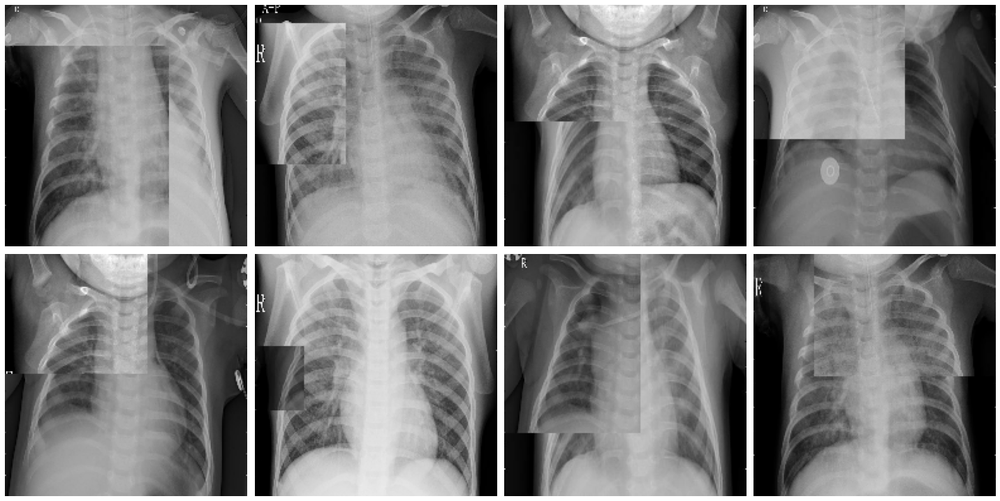

In [14]:
temp_ds = train_set.map(
    lambda x, y: CutMix()([x, y]), num_parallel_calls=params.autotune
)
make_plot(temp_ds, take_batch=1, title=False) 

In [15]:
class RandomMixUpCutMix(layers.Layer):
    def __init__(self, switch_prob=0.50, **kwargs):
        super().__init__(**kwargs)
        self.switch_prob = (
            switch_prob  # probability of switching between mixup and cutmix
        )
        self.mixup = CutMix()
        self.cutmix = MixUp()

    def call(self, batch_inputs):
        return tf.cond(
            tf.less(
                tf.random.uniform([], minval=0, maxval=1, dtype=tf.float32),
                tf.cast(self.switch_prob, tf.float32),
            ),
            lambda: self.mixup(batch_inputs),
            lambda: self.cutmix(batch_inputs),
        )

    def get_config(self):
        config = {
            "switch_prob": self.switch_prob,
        }
        base_config = super().get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [16]:
import jax
from jax import jit
from jax import random
from jax import numpy as jnp
from jax.experimental import jax2tf

# from tensorflow.python.compiler.xla.experimental.xla_sharding import xla_sharding

In [19]:
class RandomChannelShuffle(layers.Layer):
    """Shuffle channels of an input image.

    Ref. https://gist.github.com/innat/35ab35329e2ca890a17556384056334b
    """
    def __init__(self, groups=3, **kwargs):
        super().__init__(**kwargs)
        self.groups = groups

    @partial(jit, static_argnums=0)
    def _jax_channel_shuffling(self, images):
        batch_size, height, width, num_channels = images.shape

        if not num_channels % self.groups == 0:
            raise ValueError(
                "The number of input channels should be "
                "divisible by the number of groups."
                f"Received: channels={num_channels}, groups={self.groups}"
            )

        channels_per_group = num_channels // self.groups

        images = images.reshape(-1, height, width, self.groups, channels_per_group)
        images = images.transpose([3, 1, 2, 4, 0])
        key = random.PRNGKey(np.random.randint(50))
        images = random.permutation(key=key, x=images, axis=0)
        images = images.transpose([4, 1, 2, 3, 0])
        images = images.reshape(-1, height, width, num_channels)
        return images

    def call(self, images, training=True):
        if training:
            return jax2tf.convert(
                self._jax_channel_shuffling, polymorphic_shapes=("batch, ...")
            )(images)
        else:
            return images
    
    def get_config(self):
        config = {
            "groups": self.groups,
        }
        base_config = super().get_config()
        return dict(list(base_config.items()) + list(config.items()))

2023-10-06 09:04:40.055497: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x5622b1ceae60 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2023-10-06 09:04:40.055551: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2023-10-06 09:04:40.225281: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2023-10-06 09:04:40.249716: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_1944'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 09:04:40.250957: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED

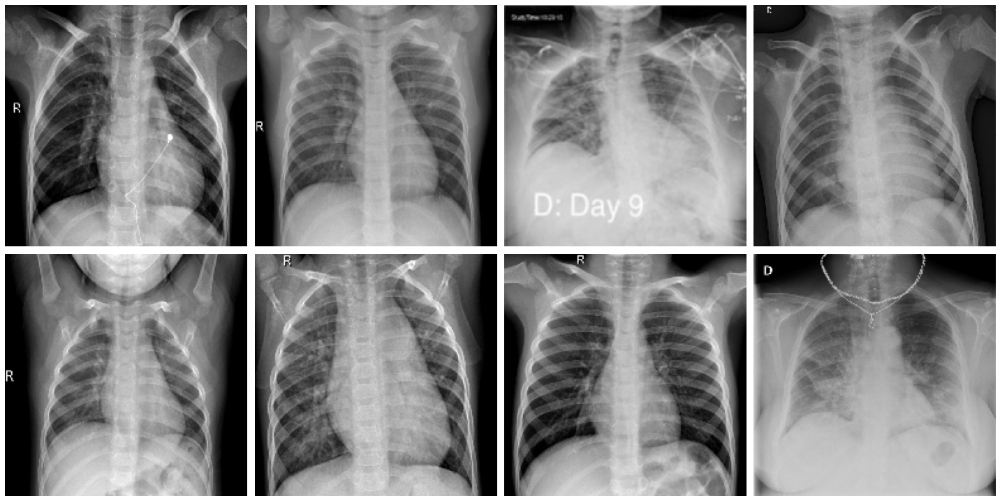

In [20]:
temp_ds = train_set.map(
    lambda x, y: (RandomChannelShuffle()(x), y), num_parallel_calls=params.autotune
)
make_plot(temp_ds, take_batch=1, title=False) 

In [21]:
class RandomGrayscale(layers.Layer):
    """Grayscale is a preprocessing layer that transforms
    RGB images to Grayscale images.

    Ref. https://gist.github.com/innat/4e89725ccdcd763e0a6ba19216fd60bf
    """

    def __init__(self, output_channel=1, prob=1, **kwargs):
        super().__init__(**kwargs)
        self.output_channel = self._check_input_params(output_channel)

    def _check_input_params(self, output_channels):
        if output_channels not in [1, 3]:
            raise ValueError(
                "Received invalid argument output_channels. "
                f"output_channels must be in 1 or 3. Got {output_channels}"
            )
        return output_channels

    @partial(jit, static_argnums=0)
    def _jax_gray_scale(self, images):
        rgb_weights = jnp.array([0.2989, 0.5870, 0.1140], dtype=images.dtype)
        grayscale = (rgb_weights * images).sum(axis=-1)

        if self.output_channel == 1:
            grayscale = jnp.expand_dims(grayscale, axis=-1)
            return grayscale
        elif self.output_channel == 3:
            return jnp.stack([grayscale] * 3, axis=-1)
        else:
            raise ValueError("Unsupported value for `output_channels`.")

    def call(self, images, training=True):
        if training:
            return jax2tf.convert(
                self._jax_gray_scale, polymorphic_shapes=("batch, ...")
            )(images)
        else:
            return images

    def get_config(self):
        config = {
            "output_channel": self.output_channel,
        }
        base_config = super().get_config()
        return dict(list(base_config.items()) + list(config.items()))

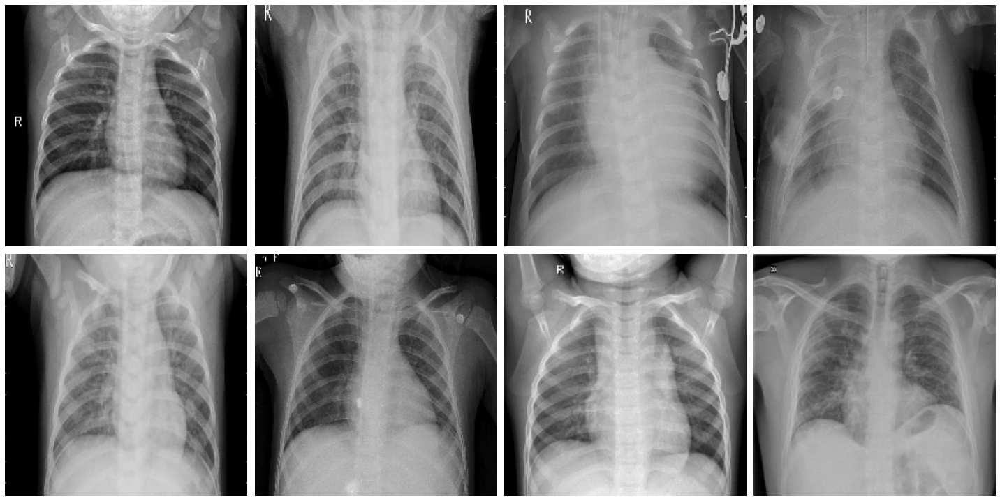

In [22]:
temp_ds = train_set.map(
    lambda x, y: (RandomGrayscale(output_channel=3)(x), y), num_parallel_calls=params.autotune
)
make_plot(temp_ds, take_batch=1, title=False)

In [26]:
jax_to_keras_augment = keras.Sequential(
    [
        RandomApply(RandomGrayscale(output_channel=3), probability=0.2),
        RandomApply(RandomChannelShuffle(), probability=0.5),
    ],
    name="jax2keras_augment",
)


tf_to_keras_augment = keras.Sequential(
    [
        RandomApply(layers.RandomFlip("horizontal"), probability=0.5),
        RandomApply(layers.RandomZoom(0.2, 0.3), probability=0.2),
        RandomApply(
            layers.RandomRotation((0.05, 0.1), fill_mode="wrap"), probability=0.5
        ),
    ],
    name="tf2keras_augment",
)

In [27]:
# for train set : augmentation
keras_aug = keras.Sequential(
    [
        layers.Resizing(height=params.image_size, width=params.image_size),
        jax_to_keras_augment,
        tf_to_keras_augment,
    ],
    name="keras_augment",
)

train_ds = train_set.shuffle(10 * params.batch_size)
train_ds = train_ds.map(
    lambda x, y: (keras_aug(x), y), num_parallel_calls=params.autotune
)
train_ds = train_ds.map(
    lambda x, y: RandomMixUpCutMix()([x, y]), num_parallel_calls=params.autotune
)

2023-10-06 09:16:03.603887: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_19548'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_6/cond/then/_8/keras_augment/jax2keras_augment/random_apply_6/cond/random_channel_shuffle_1/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 09:16:03.604354: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_19548'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_6/cond/then/_8/keras_augment/jax2keras_augment/random_apply_6/cond/random_channel_shuffle_1/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augm

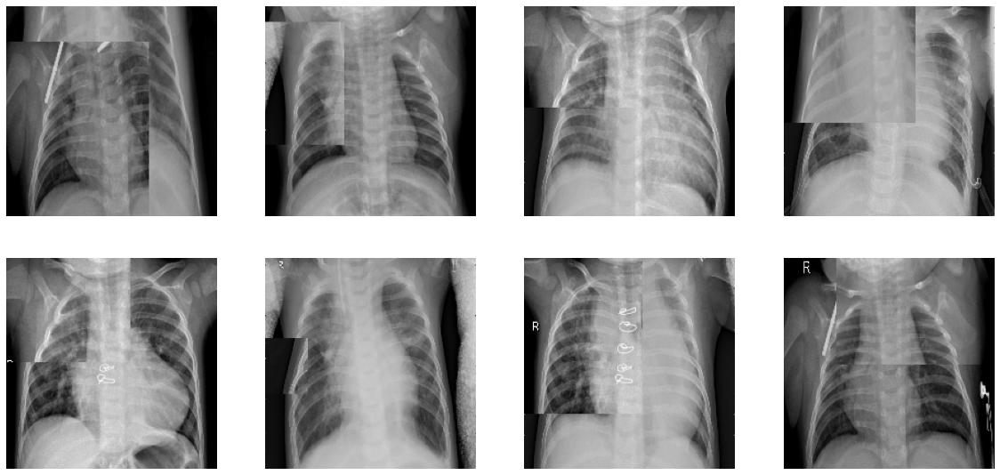

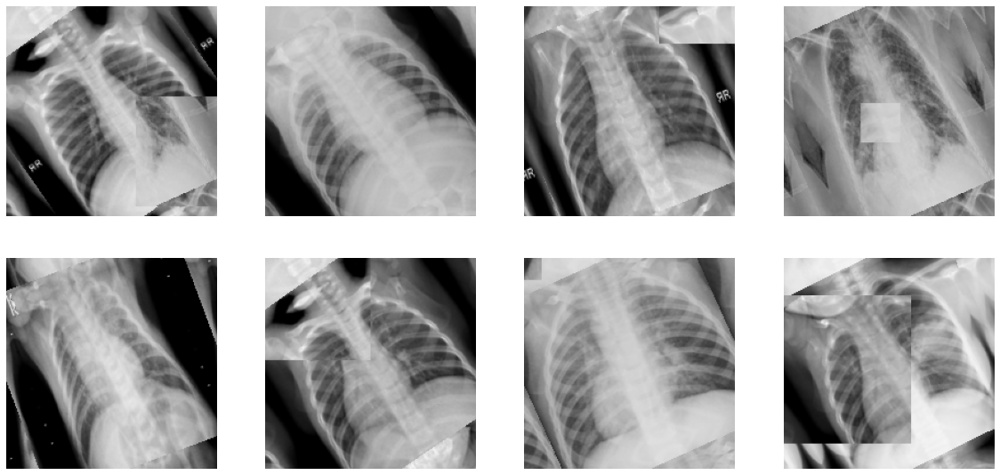

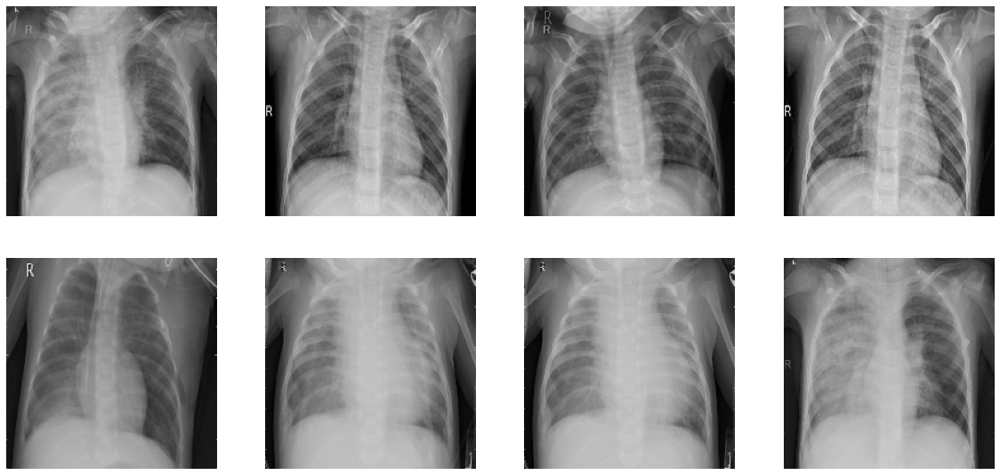

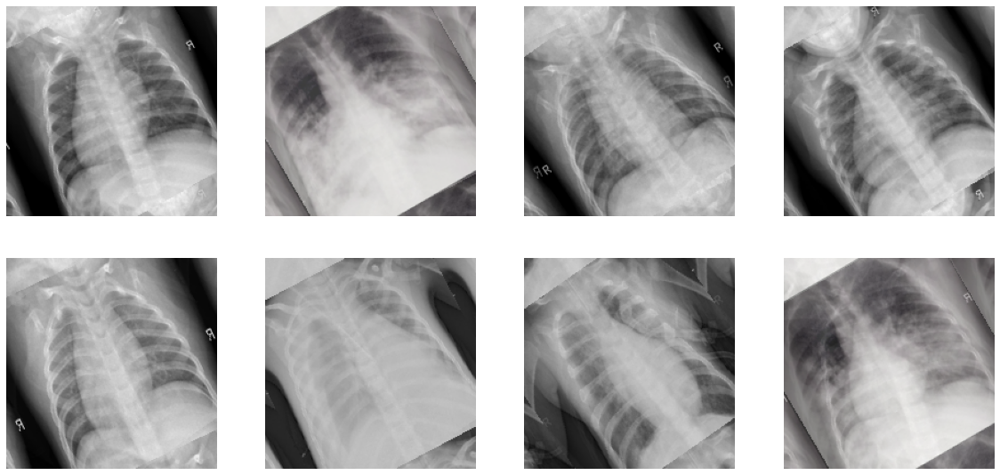

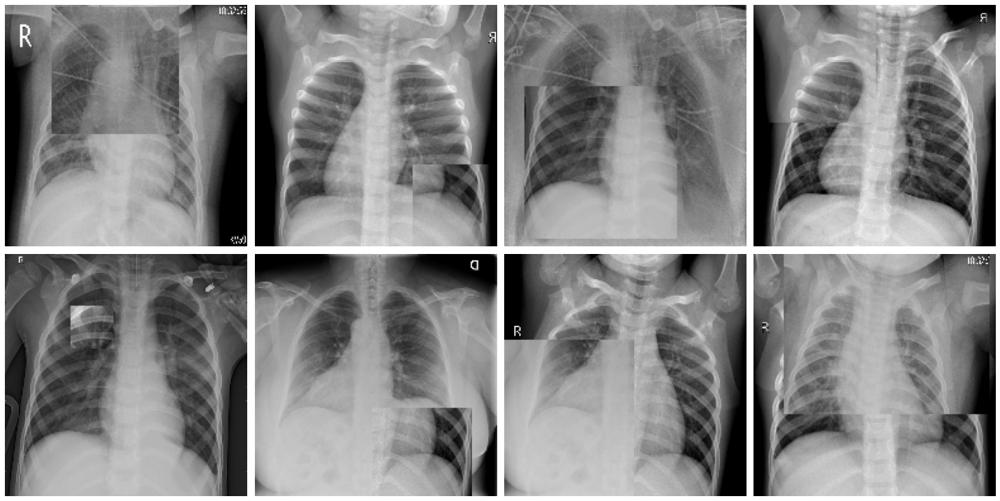

In [28]:
make_plot(train_ds, take_batch=5, title=False) 


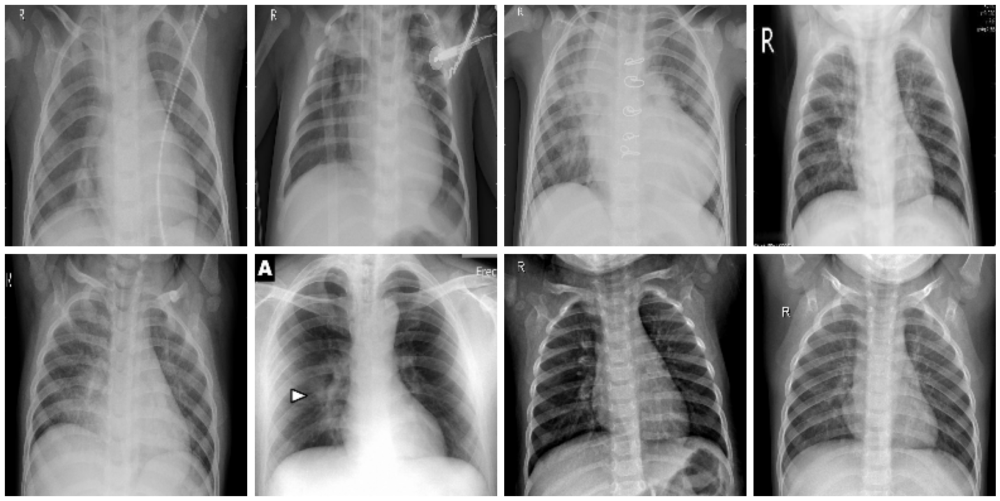

In [26]:
make_plot(val_set, take_batch=1, title=False) 


In [27]:
train_ds = train_ds.prefetch(buffer_size=params.autotune)
val_ds = val_set.prefetch(buffer_size=params.autotune)

In [28]:
patch_size      = (2,2)   # 2-by-2 sized patches
dropout_rate    = 0.5     # Dropout rate
num_heads       = 8       # Attention heads
embed_dim       = 32      # Embedding dimension
num_mlp         = 64     # MLP layer size
qkv_bias        = True    # Convert embedded patches to query, key, and values
window_size     = 2       # Size of attention window
shift_size      = 1       # Size of shifting window
image_dimension = 12      # Initial image size / Input size of the transformer model 

num_patch_x = image_dimension // patch_size[0]
num_patch_y = image_dimension // patch_size[1]

In [29]:
def window_partition(x, window_size):
    _, height, width, channels = x.shape
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    x = tf.reshape(
        x, shape=(-1, patch_num_y, window_size, patch_num_x, window_size, channels)
    )
    x = tf.transpose(x, (0, 1, 3, 2, 4, 5))
    windows = tf.reshape(x, shape=(-1, window_size, window_size, channels))
    return windows


def window_reverse(windows, window_size, height, width, channels):
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    
    x = tf.reshape(
        windows,
        shape=(-1, patch_num_y, patch_num_x, window_size, window_size, channels),
    )
    x = tf.transpose(x, perm=(0, 1, 3, 2, 4, 5))
    x = tf.reshape(x, shape=(-1, height, width, channels))
    return x


class DropPath(layers.Layer):
    def __init__(self, drop_prob=None, **kwargs):
        super(DropPath, self).__init__(**kwargs)
        self.drop_prob = drop_prob

    def call(self, inputs, training=None):
        if self.drop_prob == 0.0 or not training:
            return inputs
        else:
            batch_size = tf.shape(inputs)[0]
            keep_prob = 1 - self.drop_prob
            path_mask_shape = (batch_size,) + (1,) * (len(tf.shape(inputs)) - 1)
            path_mask = tf.floor(
                backend.random_bernoulli(path_mask_shape, p=keep_prob)
            )
            outputs = (
                tf.math.divide(tf.cast(inputs, dtype=tf.float32), keep_prob) * path_mask
            )
            return outputs

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "drop_prob": self.drop_prob,
            }
        )
        return config

In [30]:
class PatchExtract(layers.Layer):
    def __init__(self, patch_size, **kwargs):
        super().__init__(**kwargs)
        self.patch_size_x = patch_size[0]
        self.patch_size_y = patch_size[0]

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=(1, self.patch_size_x, self.patch_size_y, 1),
            strides=(1, self.patch_size_x, self.patch_size_y, 1),
            rates=(1, 1, 1, 1),
            padding="VALID",
        )
        patch_dim = patches.shape[-1]
        patch_num = patches.shape[1]
        return tf.reshape(patches, (batch_size, patch_num * patch_num, patch_dim))

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "patch_size_y": self.patch_size_y,
                "patch_size_x": self.patch_size_x,
            }
        )
        return config


class PatchEmbedding(layers.Layer):
    def __init__(self, num_patch, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.num_patch = num_patch
        self.proj = layers.Dense(embed_dim)
        self.pos_embed = layers.Embedding(input_dim=num_patch, output_dim=embed_dim)

    def call(self, patch):
        pos = tf.range(start=0, limit=self.num_patch, delta=1)
        return self.proj(patch) + self.pos_embed(pos)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "num_patch": self.num_patch,
            }
        )
        return config


class PatchMerging(layers.Layer):
    def __init__(self, num_patch, embed_dim):
        super().__init__()
        self.num_patch = num_patch
        self.embed_dim = embed_dim
        self.linear_trans = layers.Dense(2 * embed_dim, use_bias=False)

    def call(self, x):
        height, width = self.num_patch
        _, _, C = x.get_shape().as_list()
        x = tf.reshape(x, shape=(-1, height, width, C))
        feat_maps = x

        x0 = x[:, 0::2, 0::2, :]
        x1 = x[:, 1::2, 0::2, :]
        x2 = x[:, 0::2, 1::2, :]
        x3 = x[:, 1::2, 1::2, :]
        x = tf.concat((x0, x1, x2, x3), axis=-1)
        x = tf.reshape(x, shape=(-1, (height // 2) * (width // 2), 4 * C))
        return self.linear_trans(x), feat_maps

    def get_config(self):
        config = super().get_config()
        config.update({"num_patch": self.num_patch, "embed_dim": self.embed_dim})
        return config

In [31]:
class WindowAttention(layers.Layer):
    def __init__(
        self,
        dim,
        window_size,
        num_heads,
        qkv_bias=True,
        dropout_rate=0.0,
        return_attention_scores=False,
        **kwargs
    ):
        super().__init__(**kwargs)
        self.dim = dim
        self.window_size = window_size
        self.num_heads = num_heads
        self.scale = (dim // num_heads) ** -0.5
        self.return_attention_scores = return_attention_scores
        self.qkv = layers.Dense(dim * 3, use_bias=qkv_bias)
        self.dropout = layers.Dropout(dropout_rate)
        self.proj = layers.Dense(dim)

    def build(self, input_shape):
        self.relative_position_bias_table = self.add_weight(
            shape=(
                (2 * self.window_size[0] - 1) * (2 * self.window_size[1] - 1),
                self.num_heads,
            ),
            initializer="zeros",
            trainable=True,
            name="relative_position_bias_table",
        )

        self.relative_position_index = self.get_relative_position_index(
            self.window_size[0], self.window_size[1]
        )
        super().build(input_shape)

    def get_relative_position_index(self, window_height, window_width):
        x_x, y_y = tf.meshgrid(range(window_height), range(window_width))
        coords = tf.stack([y_y, x_x], axis=0)
        coords_flatten = tf.reshape(coords, [2, -1])

        relative_coords = coords_flatten[:, :, None] - coords_flatten[:, None, :]
        relative_coords = tf.transpose(relative_coords, perm=[1, 2, 0])

        x_x = (relative_coords[:, :, 0] + window_height - 1) * (2 * window_width - 1)
        y_y = relative_coords[:, :, 1] + window_width - 1
        relative_coords = tf.stack([x_x, y_y], axis=-1)

        return tf.reduce_sum(relative_coords, axis=-1)

    def call(self, x, mask=None):
        _, size, channels = x.shape
        head_dim = channels // self.num_heads
        x_qkv = self.qkv(x)
        x_qkv = tf.reshape(x_qkv, shape=(-1, size, 3, self.num_heads, head_dim))
        x_qkv = tf.transpose(x_qkv, perm=(2, 0, 3, 1, 4))
        q, k, v = x_qkv[0], x_qkv[1], x_qkv[2]
        q = q * self.scale
        k = tf.transpose(k, perm=(0, 1, 3, 2))
        attn = q @ k

        relative_position_bias = tf.gather(
            self.relative_position_bias_table,
            self.relative_position_index,
            axis=0,
        )
        relative_position_bias = tf.transpose(relative_position_bias, [2, 0, 1])
        attn = attn + tf.expand_dims(relative_position_bias, axis=0)

        if mask is not None:
            nW = mask.get_shape()[0]
            mask_float = tf.cast(
                tf.expand_dims(tf.expand_dims(mask, axis=1), axis=0), tf.float32
            )
            attn = (
                tf.reshape(attn, shape=(-1, nW, self.num_heads, size, size))
                + mask_float
            )
            attn = tf.reshape(attn, shape=(-1, self.num_heads, size, size))
            attn = tf.nn.softmax(attn, axis=-1)
        else:
            attn = tf.nn.softmax(attn, axis=-1)
        attn = self.dropout(attn)

        x_qkv = attn @ v
        x_qkv = tf.transpose(x_qkv, perm=(0, 2, 1, 3))
        x_qkv = tf.reshape(x_qkv, shape=(-1, size, channels))
        x_qkv = self.proj(x_qkv)
        x_qkv = self.dropout(x_qkv)

        if self.return_attention_scores:
            return x_qkv, attn
        else:
            return x_qkv

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "dim": self.dim,
                "window_size": self.window_size,
                "num_heads": self.num_heads,
                "scale": self.scale,
            }
        )
        return config

In [32]:
class SwinTransformer(layers.Layer):
    def __init__(
        self, 
        dim,
        num_patch,
        num_heads,
        window_size=7,
        shift_size=0,
        num_mlp=1024,
        qkv_bias=True,
        dropout_rate=0.0,
        **kwargs,
    ):
        super(SwinTransformer, self).__init__(**kwargs)

        self.dim = dim 
        self.num_patch = num_patch  
        self.num_heads = num_heads 
        self.window_size = window_size  
        self.shift_size = shift_size  
        self.num_mlp = num_mlp  

        self.norm1 = layers.LayerNormalization(epsilon=1e-5)
        self.attn = WindowAttention(
            dim,
            window_size=(self.window_size, self.window_size),
            num_heads=num_heads,
            qkv_bias=qkv_bias,
            dropout_rate=dropout_rate,
        )
        self.drop_path = (
            DropPath(dropout_rate) if dropout_rate > 0.0 else tf.identity
        )
        self.norm2 = layers.LayerNormalization(epsilon=1e-5)

        self.mlp = keras.Sequential(
            [
                layers.Dense(num_mlp),
                layers.Activation(keras.activations.gelu),
                layers.Dropout(dropout_rate),
                layers.Dense(dim),
                layers.Dropout(dropout_rate),
            ]
        )

        if min(self.num_patch) < self.window_size:
            self.shift_size = 0
            self.window_size = min(self.num_patch)

    def build(self, input_shape):
        if self.shift_size == 0:
            self.attn_mask = None
        else:
            height, width = self.num_patch
            h_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            w_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            mask_array = jnp.zeros((1, height, width, 1))
            count = 0
            for h in h_slices:
                for w in w_slices:
                    mask_array[:, h, w, :] = count
                    count += 1
            mask_array = tf.convert_to_tensor(mask_array)

            # mask array to windows
            mask_windows = window_partition(mask_array, self.window_size)
            mask_windows = tf.reshape(
                mask_windows, shape=[-1, self.window_size * self.window_size]
            )
            attn_mask = tf.expand_dims(mask_windows, axis=1) - tf.expand_dims(
                mask_windows, axis=2
            )
            attn_mask = tf.where(attn_mask != 0, -100.0, attn_mask)
            attn_mask = tf.where(attn_mask == 0, 0.0, attn_mask)
            self.attn_mask = tf.Variable(initial_value=attn_mask, trainable=False)

    def call(self, x):
        height, width = self.num_patch
        _, num_patches_before, channels = x.shape
        x_skip = x
        x = self.norm1(x)
        x = tf.reshape(x, shape=(-1, height, width, channels))
        if self.shift_size > 0:
            shifted_x = tf.roll(
                x, shift=[-self.shift_size, -self.shift_size], axis=[1, 2]
            )
        else:
            shifted_x = x

        x_windows = window_partition(shifted_x, self.window_size)
        x_windows = tf.reshape(
            x_windows, shape=(-1, self.window_size * self.window_size, channels)
        )
        attn_windows = self.attn(x_windows, mask=self.attn_mask)

        attn_windows = tf.reshape(
            attn_windows, shape=(-1, self.window_size, self.window_size, channels)
        )
        shifted_x = window_reverse(
            attn_windows, self.window_size, height, width, channels
        )
        if self.shift_size > 0:
            x = tf.roll(
                shifted_x, shift=[self.shift_size, self.shift_size], axis=[1, 2]
            )
        else:
            x = shifted_x

        x = tf.reshape(x, shape=(-1, height * width, channels))
        x = self.drop_path(x)
        x = tf.cast(x_skip, dtype=tf.float32) + tf.cast(x, dtype=tf.float32)
        x_skip = x
        x = self.norm2(x)
        x = self.mlp(x)
        x = self.drop_path(x)
        x = tf.cast(x_skip, dtype=tf.float32) + tf.cast(x, dtype=tf.float32)
        return x

In [33]:
# base cnn models
base = keras.applications.EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_tensor=keras.Input((params.image_size, params.image_size, 3)),
)

In [34]:
class HybridModel(keras.Model):
    def __init__(self, model_name, **kwargs):
        super().__init__(name=model_name, **kwargs)

        # base model with compatible output which will be an input of transformer model
        self.multi_output_cnn = keras.Model(
            [base.inputs],
            [base.get_layer("block6a_expand_activation").output, base.output],
            name="efficientnet",
        )

        # base model's (cnn model) head
        self.conv_head = keras.Sequential(
            [
                layers.GlobalAveragePooling2D(),
                layers.AlphaDropout(0.5),
            ],
            name="conv_head",
        )

        # stuff of swin transformers
        self.patch_extract = PatchExtract(patch_size)
        self.patch_embedds = PatchEmbedding(num_patch_x * num_patch_y, embed_dim)
        self.patch_merging = PatchMerging(
            (num_patch_x, num_patch_y), embed_dim=embed_dim
        )

        # swin blocks containers
        self.swin_sequences = keras.Sequential(name="swin_blocks")
        for i in range(shift_size):
            self.swin_sequences.add(
                SwinTransformer(
                    dim=embed_dim,
                    num_patch=(num_patch_x, num_patch_y),
                    num_heads=num_heads,
                    window_size=window_size,
                    shift_size=i,
                    num_mlp=num_mlp,
                    qkv_bias=qkv_bias,
                    dropout_rate=dropout_rate,
                )
            )

        # swin block's head
        self.swin_head = keras.Sequential(
            [
                layers.GlobalAveragePooling1D(),
                layers.AlphaDropout(0.5),
                layers.BatchNormalization(),
            ],
            name="swin_head",
        )

        # classifier
        self.classifier = layers.Dense(
            params.class_number, activation=None, dtype="float32"
        )

        # build the graph
        self.build_graph()

    def forward_cnn(self, inputs):
        # CNN model.
        return self.multi_output_cnn(inputs)

    def forward_transformer(self, inputs):
        # Transformer model.
        x = self.patch_extract(inputs)
        x = self.patch_embedds(x)
        x = self.swin_sequences(tf.cast(x, dtype=tf.float32))
        x, swin_gcam_top = self.patch_merging(x)
        return x, swin_gcam_top

    def call(self, inputs, training=None, **kwargs):
        cnn_mid_layer, cnn_gcam_top = self.forward_cnn(inputs)
        transformer_output, transformer_gcam_top = self.forward_transformer(
            cnn_mid_layer
        )

        transformer_output = self.swin_head(transformer_output)
        cnn_output = self.conv_head(cnn_gcam_top)
        logits = self.classifier(tf.concat([transformer_output, cnn_output], axis=-1))

        if training:
            return logits
        else:
            return logits, cnn_gcam_top, transformer_gcam_top

    def build_graph(self):
        x = keras.Input(shape=(params.image_size, params.image_size, 3))
        return keras.Model(inputs=[x], outputs=self.call(x))

In [35]:
class GradientAccumulation(HybridModel):
    """Subclassing the mdoel class to override the train step to 
    implemnet gradient accumulation.
    
    Ref: https://gist.github.com/innat/ba6740293e7b7b227829790686f2119c
    """

    def __init__(self, n_gradients, **kwargs):
        super().__init__(**kwargs)
        self.n_gradients = tf.constant(n_gradients, dtype=tf.int32)
        self.n_acum_step = tf.Variable(0, dtype=tf.int32, trainable=False)
        self.gradient_accumulation = [
            tf.Variable(tf.zeros_like(v, dtype=tf.float32), trainable=False)
            for v in self.trainable_variables
        ]

    def train_step(self, data):
        # track accumulation step update
        self.n_acum_step.assign_add(1)

        # Unpack the data. Its structure depends on your model and
        # on what you pass to `fit()`.
        x, y = data

        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)  # Forward pass
            loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

        # Calculate batch gradients
        gradients = tape.gradient(loss, self.trainable_variables)

        # Accumulate batch gradients
        for i in range(len(self.gradient_accumulation)):
            self.gradient_accumulation[i].assign_add(gradients[i])

        # If n_acum_step reach the n_gradients then we apply accumulated gradients to -
        # update the variables otherwise do nothing
        tf.cond(
            tf.equal(self.n_acum_step, self.n_gradients),
            self.apply_accu_gradients,
            lambda: None,
        )

        # Return a dict mapping metric names to current value.
        # Note that it will include the loss (tracked in self.metrics).
        self.compiled_metrics.update_state(y, y_pred)
        return {m.name: m.result() for m in self.metrics}

    def apply_accu_gradients(self):
        # Update weights
        self.optimizer.apply_gradients(
            zip(self.gradient_accumulation, self.trainable_variables)
        )

        # reset accumulation step
        self.n_acum_step.assign(0)
        for i in range(len(self.gradient_accumulation)):
            self.gradient_accumulation[i].assign(
                tf.zeros_like(self.trainable_variables[i], dtype=tf.float32)
            )

    def test_step(self, data):
        # Unpack the data
        x, y = data

        # Compute predictions
        y_pred, base_gcam_top, swin_gcam_top = self(x, training=False)

        # Updates the metrics tracking the loss
        self.compiled_loss(y, y_pred, regularization_losses=self.losses)

        # Update the metrics.
        self.compiled_metrics.update_state(y, y_pred)

        # Return a dict mapping metric names to current value.
        # Note that it will include the loss (tracked in self.metrics).
        return {m.name: m.result() for m in self.metrics}
    

In [36]:
def get_model(plot_summary=False, plot_graph=False):
    keras.backend.clear_session()
    
    model = GradientAccumulation(
        n_gradients=params.num_grad_accumulation, model_name="HybridModel"
    )

    if plot_summary:
        display(
            model.build_graph().summary()
        )

    if plot_graph:
        display(
            keras.utils.plot_model(
                model.build_graph(),
                show_shapes=True,
                show_layer_names=True,
                expand_nested=False,
            )
        )

    # compile
    model.compile(
        loss=losses.CategoricalCrossentropy(
            label_smoothing=params.label_smooth, from_logits=True
        ),
        optimizer=optimizers.Adam(learning_rate, amsgrad=True),
        metrics=["accuracy"],
    )
    return model

In [37]:
from tensorflow.keras import losses
from tensorflow.keras import metrics
from tensorflow.keras import callbacks
from tensorflow.keras import optimizers

ckp = callbacks.ModelCheckpoint(
    "model.h5",
    monitor="val_accuracy",
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode="max",
)
log = callbacks.CSVLogger("history.csv", separator=",", append=False)

In [38]:
class WarmupLearningRateSchedule(optimizers.schedules.LearningRateSchedule):
    """WarmupLearningRateSchedule a variety of learning rate
    decay schedules with warm up.
    
    Ref. https://gist.github.com/innat/69e8f3500c2418c69b150a0a651f31dc
    """

    def __init__(
        self,
        initial_lr,
        steps_per_epoch=None,
        lr_decay_type="exponential",
        decay_factor=0.97,
        decay_epochs=2.4,
        total_steps=None,
        warmup_epochs=5,
        minimal_lr=0, 
        **kwargs
    ):
        super().__init__(**kwargs)
        self.initial_lr = initial_lr
        self.steps_per_epoch = steps_per_epoch
        self.lr_decay_type = lr_decay_type
        self.decay_factor = decay_factor
        self.decay_epochs = decay_epochs
        self.total_steps = total_steps
        self.warmup_epochs = warmup_epochs
        self.minimal_lr = minimal_lr

    def __call__(self, step):
        if self.lr_decay_type == "exponential":
            assert self.steps_per_epoch is not None
            decay_steps = self.steps_per_epoch * self.decay_epochs
            lr = schedules.ExponentialDecay(
                self.initial_lr, decay_steps, self.decay_factor, staircase=True
            )(step)
            
        elif self.lr_decay_type == "cosine":
            assert self.total_steps is not None
            lr = (
                0.5
                * self.initial_lr
                * (1 + tf.cos(np.pi * tf.cast(step, tf.float32) / self.total_steps))
            )

        elif self.lr_decay_type == "linear":
            assert self.total_steps is not None
            lr = (1.0 - tf.cast(step, tf.float32) / self.total_steps) * self.initial_lr

        elif self.lr_decay_type == "constant":
            lr = self.initial_lr

        elif self.lr_decay_type == "cosine_restart":
            decay_steps = self.steps_per_epoch * self.decay_epochs
            lr = tf.keras.experimental.CosineDecayRestarts(
                self.initial_lr, decay_steps
            )(step)
        else:
            assert False, "Unknown lr_decay_type : %s" % self.lr_decay_type

        if self.minimal_lr:
            lr = tf.math.maximum(lr, self.minimal_lr)

        if self.warmup_epochs:
            warmup_steps = int(self.warmup_epochs * self.steps_per_epoch)
            warmup_lr = (
                self.initial_lr
                * tf.cast(step, tf.float32)
                / tf.cast(warmup_steps, tf.float32)
            )
            lr = tf.cond(step < warmup_steps, lambda: warmup_lr, lambda: lr)

        return lr

    def get_config(self):
        return {
            "initial_lr": self.initial_lr,
            "steps_per_epoch": self.steps_per_epoch,
            "lr_decay_type": self.lr_decay_type,
            "decay_factor": self.decay_factor,
            "decay_epochs": self.decay_epochs,
            "total_steps": self.total_steps,
            "warmup_epochs": self.warmup_epochs,
            "minimal_lr": self.minimal_lr,
        }

Text(0, 0.5, 'Learning Rate')

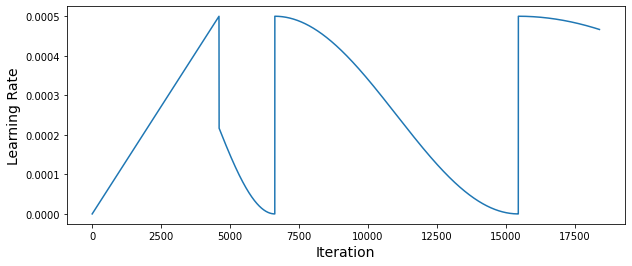

In [39]:
learning_rate = WarmupLearningRateSchedule(
    params.scaled_lr,
    steps_per_epoch=params.train_step,
    decay_epochs=params.lr_decay_epoch,
    warmup_epochs=params.lr_warmup_epoch,
    decay_factor=params.lr_decay_factor,
    lr_decay_type=params.lr_sched,
    total_steps=params.total_steps,
    minimal_lr=params.scaled_lr_min,
)

rng = [i for i in range(params.total_steps)]
lr_y = [learning_rate(x) for x in rng]
plt.figure(figsize=(10, 4))
plt.plot(rng, lr_y)
plt.xlabel("Iteration", size=14)
plt.ylabel("Learning Rate", size=14)

In [40]:
model = get_model(plot_summary=True, plot_graph=False)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 192, 192, 3)]        0         []                            
                                                                                                  
 efficientnet (Functional)   [(None, 12, 12, 672),        4049571   ['input_2[0][0]']             
                              (None, 6, 6, 1280)]                                                 
                                                                                                  
 patch_extract (PatchExtrac  (None, 36, 2688)             0         ['efficientnet[1][0]']        
 t)                                                                                               
                                                                                            

None

In [41]:

history = model.fit(
    train_ds,
    epochs=params.epochs,
#     callbacks=[ckp, log],
    validation_data=val_ds,
    verbose=params.verbosity,
).history

2023-10-06 05:47:44.248454: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:47:44.249001: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

Epoch 1/20


2023-10-06 05:47:44.628026: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:47:44.628560: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer


    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer


    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer


    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer
2023-10-06 05:48:15.565199: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8903


  7/920 [..............................] - ETA: 1:00 - loss: 1.8364 - accuracy: 0.2857

2023-10-06 05:48:19.623679: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x55a3861a2df0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-10-06 05:48:19.623733: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Quadro GV100, Compute Capability 7.0


920/920 [==============================] - 117s 90ms/step - loss: 1.8584 - accuracy: 0.2533 - val_loss: nan - val_accuracy: 0.2089
Epoch 2/20


2023-10-06 05:49:42.280763: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:49:42.281214: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 63s 65ms/step - loss: 1.7558 - accuracy: 0.2840 - val_loss: nan - val_accuracy: 0.5044
Epoch 3/20


2023-10-06 05:50:45.455864: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:50:45.456305: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 63s 65ms/step - loss: 1.5864 - accuracy: 0.3713 - val_loss: nan - val_accuracy: 0.6997
Epoch 4/20


2023-10-06 05:51:48.794558: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:51:48.795072: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 63s 65ms/step - loss: 1.4254 - accuracy: 0.4791 - val_loss: nan - val_accuracy: 0.7748
Epoch 5/20


2023-10-06 05:52:52.135956: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:52:52.136415: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 63s 65ms/step - loss: 1.3203 - accuracy: 0.5355 - val_loss: nan - val_accuracy: 0.7878
Epoch 6/20


2023-10-06 05:53:55.599128: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:53:55.599608: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 63s 65ms/step - loss: 1.2650 - accuracy: 0.5628 - val_loss: nan - val_accuracy: 0.7976
Epoch 7/20


2023-10-06 05:54:58.984068: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:54:58.984534: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 63s 65ms/step - loss: 1.2142 - accuracy: 0.5893 - val_loss: 2.6884 - val_accuracy: 0.7987
Epoch 8/20


2023-10-06 05:56:02.494450: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:56:02.494914: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 1.1659 - accuracy: 0.6070 - val_loss: nan - val_accuracy: 0.8128
Epoch 9/20


2023-10-06 05:57:05.414410: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:57:05.414882: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 1.1427 - accuracy: 0.6199 - val_loss: 6.5463 - val_accuracy: 0.8090
Epoch 10/20


2023-10-06 05:58:08.243354: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:58:08.243833: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 1.0985 - accuracy: 0.6321 - val_loss: nan - val_accuracy: 0.8112
Epoch 11/20


2023-10-06 05:59:11.060752: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 05:59:11.061224: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 1.0708 - accuracy: 0.6502 - val_loss: nan - val_accuracy: 0.8090
Epoch 12/20


2023-10-06 06:00:13.899132: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:00:13.899616: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 1.0540 - accuracy: 0.6581 - val_loss: 6.1690 - val_accuracy: 0.7622
Epoch 13/20


2023-10-06 06:01:16.216827: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:01:16.217383: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 1.0203 - accuracy: 0.6699 - val_loss: 10.1369 - val_accuracy: 0.8003
Epoch 14/20


2023-10-06 06:02:18.708367: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:02:18.708837: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 61s 63ms/step - loss: 0.9893 - accuracy: 0.6895 - val_loss: nan - val_accuracy: 0.7900
Epoch 15/20


2023-10-06 06:03:20.679052: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:03:20.679545: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 61s 63ms/step - loss: 0.9749 - accuracy: 0.6958 - val_loss: nan - val_accuracy: 0.8009
Epoch 16/20


2023-10-06 06:04:22.487683: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:04:22.488146: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 0.9654 - accuracy: 0.6990 - val_loss: 3.3806 - val_accuracy: 0.8030
Epoch 17/20


2023-10-06 06:05:24.632723: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:05:24.633213: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 63ms/step - loss: 0.9491 - accuracy: 0.7035 - val_loss: nan - val_accuracy: 0.7949
Epoch 18/20


2023-10-06 06:06:26.663158: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:06:26.663647: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 0.9316 - accuracy: 0.7119 - val_loss: 1.3162 - val_accuracy: 0.8096
Epoch 19/20


2023-10-06 06:07:29.050816: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:07:29.051312: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 61s 63ms/step - loss: 0.9139 - accuracy: 0.7147 - val_loss: nan - val_accuracy: 0.8264
Epoch 20/20


2023-10-06 06:08:30.860035: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:08:30.860594: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

920/920 [==============================] - 62s 64ms/step - loss: 0.9088 - accuracy: 0.7189 - val_loss: nan - val_accuracy: 0.8205


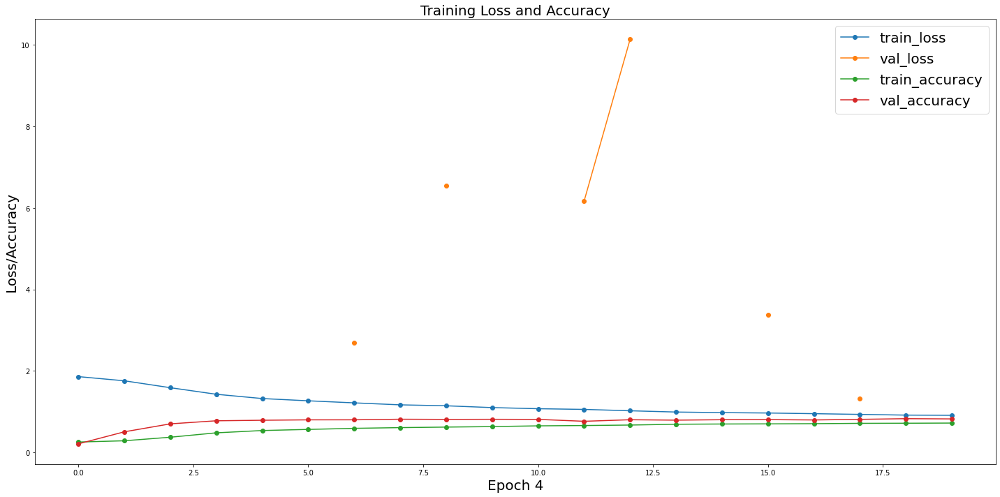

In [42]:
# Plotting
plt.figure(figsize=(20, 10))
plt.plot(range(len(history["loss"])), history["loss"], "-o", label="train_loss")
plt.plot(range(len(history["loss"])), history["val_loss"], "-o", label="val_loss")
plt.plot(range(len(history["loss"])), history["accuracy"], "-o", label="train_accuracy")
plt.plot(
    range(len(history["loss"])), history["val_accuracy"], "-o", label="val_accuracy"
)
plt.title("Training Loss and Accuracy", fontdict={'fontsize':20})
plt.xlabel(f"Epoch {len(history)}", fontsize=20)
plt.ylabel("Loss/Accuracy", fontsize=20)
plt.legend(loc="best", prop={"size": 20})
plt.tight_layout()
plt.show()

In [43]:
def plot_stuff(inputs, features_a, features_b):
    plt.figure(figsize=(25, 25))
    
    plt.subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(tf.squeeze(inputs/255, axis=0))
    plt.title('Input')
    
    plt.subplot(1, 3, 2)
    plt.axis('off')
    plt.imshow(features_a)
    plt.title('CNN')
    
    plt.subplot(1, 3, 3)
    plt.axis('off')
    plt.imshow(features_b)
    plt.title('Hybrid-CNN-Transformer')
    plt.show()

# ref: https://keras.io/examples/vision/grad_cam/
def get_img_array(img):
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

# ref: https://keras.io/examples/vision/grad_cam/
def make_gradcam_heatmap(img_array, grad_model, pred_index=None):
    with tf.GradientTape(persistent=True) as tape:
        preds, base_top, swin_top = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, base_top)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    base_top = base_top[0]
    heatmap_a = base_top @ pooled_grads[..., tf.newaxis]
    heatmap_a = tf.squeeze(heatmap_a)
    heatmap_a = tf.maximum(heatmap_a, 0) / tf.math.reduce_max(heatmap_a)
    heatmap_a = heatmap_a.numpy()

    grads = tape.gradient(class_channel, swin_top)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    swin_top = swin_top[0]
    heatmap_b = swin_top @ pooled_grads[..., tf.newaxis]
    heatmap_b = tf.squeeze(heatmap_b)
    heatmap_b = tf.maximum(heatmap_b, 0) / tf.math.reduce_max(heatmap_b)
    heatmap_b = heatmap_b.numpy()
    return heatmap_a, heatmap_b

(8, 192, 192, 3)
(6, 6) 1.0 0.0
(6, 6) 1.0 0.0


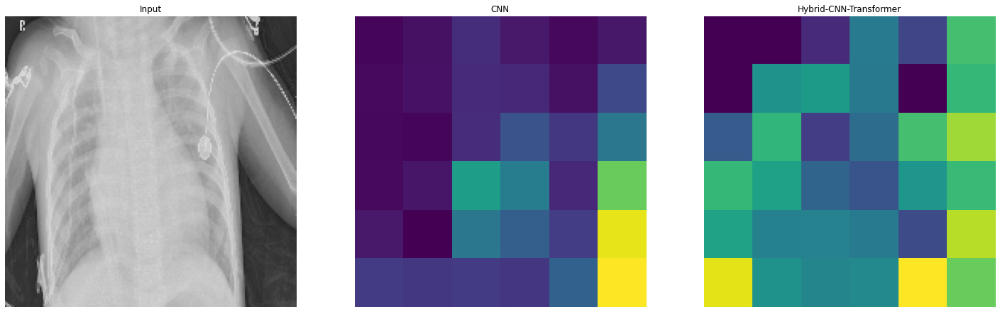

(6, 6) 1.0 0.0236
(6, 6) 1.0 0.0


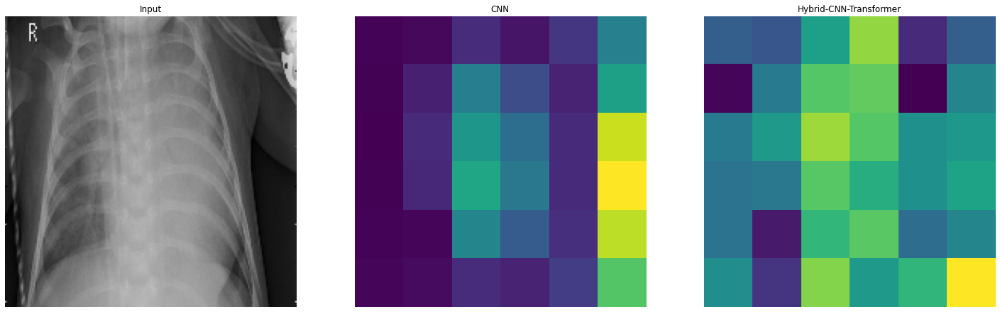

(6, 6) 1.0 0.0
(6, 6) 1.0 0.1198


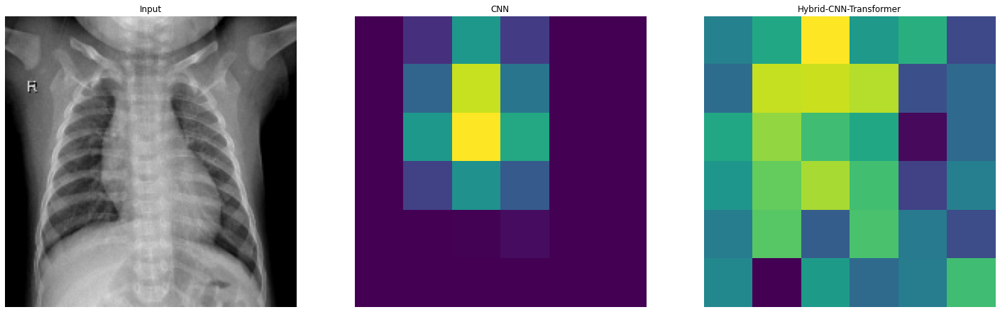

In [44]:
# Get val images
img_arrays = next(iter(val_ds))[0]
print(img_arrays.shape)

# plot utils
for img_array in img_arrays[:3]:
    # Generate class activation heatmap
    img_array = get_img_array(img_array)
    cnn_heatmap, swin_heatmap = make_gradcam_heatmap(img_array, model)
    print(cnn_heatmap.shape, cnn_heatmap.max(), cnn_heatmap.min())
    print(swin_heatmap.shape, swin_heatmap.max(), swin_heatmap.min())

    # Display heatmap
    plot_stuff(img_array, cnn_heatmap, swin_heatmap)

In [45]:
# ref: https://keras.io/examples/vision/grad_cam/
def save_and_display_gradcam(
    img,
    heatmap,
    target=None,
    pred=None,
    cam_path="cam.jpg",
    cmap="jet",  # inferno, viridis
    alpha=0.6,
    plot=None,
):
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap(cmap)

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[0], img.shape[1]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = img + jet_heatmap * alpha
    superimposed_img = keras.utils.array_to_img(superimposed_img)
    return superimposed_img

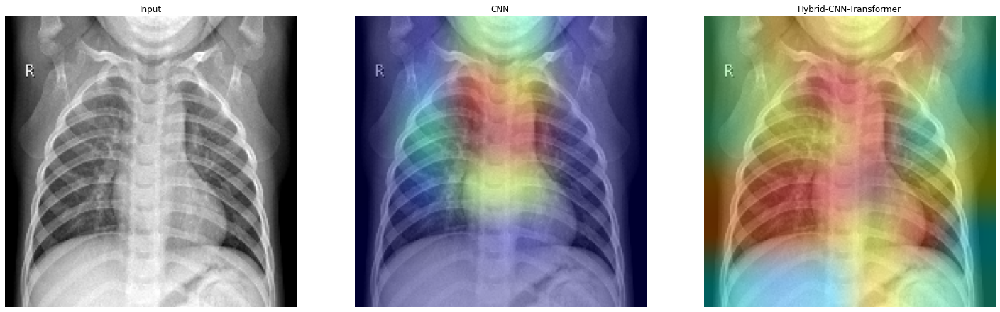

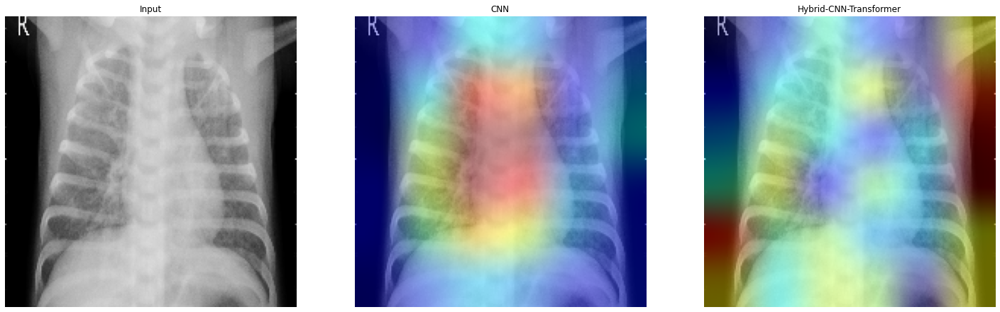

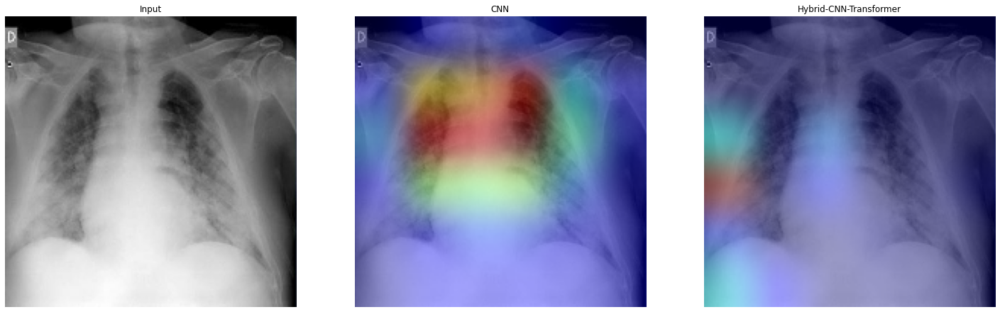

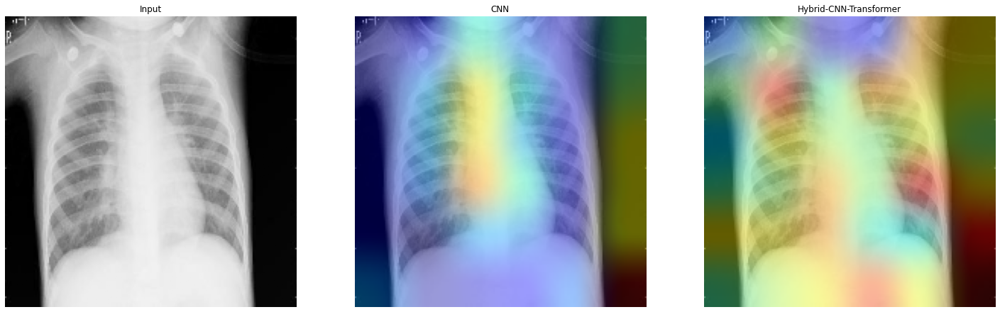

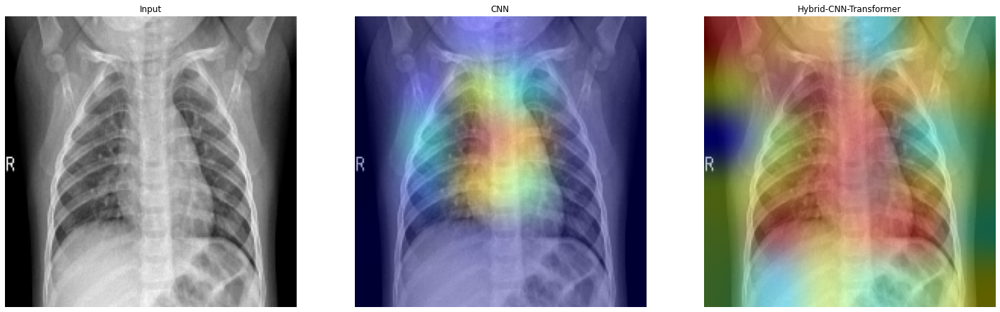

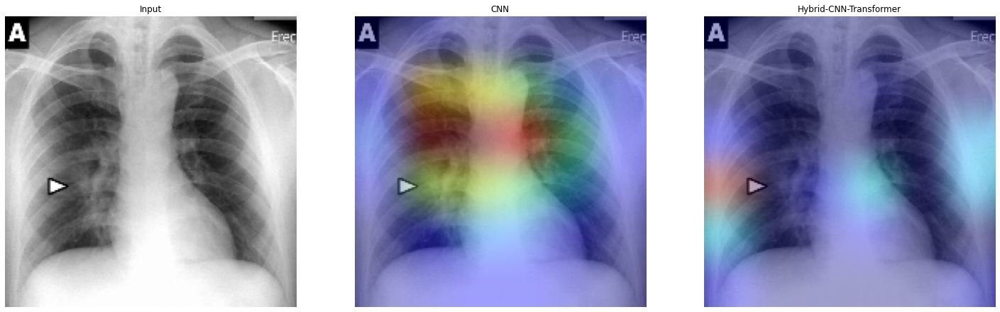

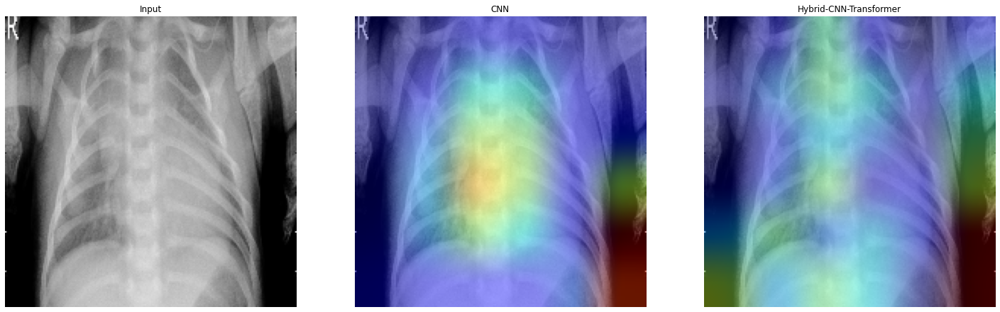

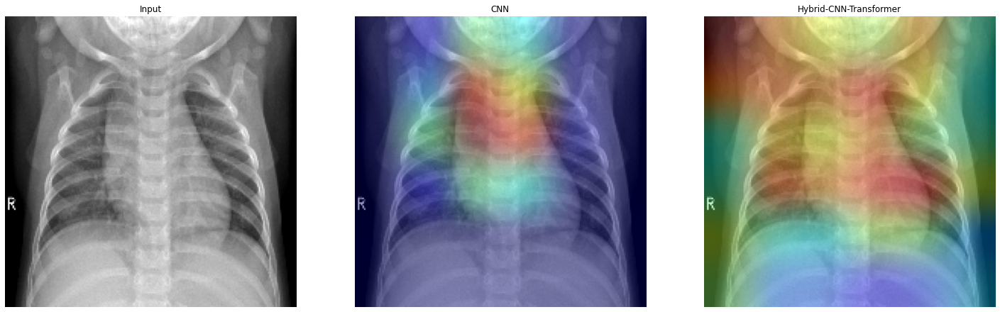

In [46]:
samples, labels = next(iter(val_ds.shuffle(params.batch_size)))

for sample, label in zip(samples, labels):
    # preparing
    img_array = sample[tf.newaxis, ...]

    # get heatmaps
    heatmap_a, heatmap_b = make_gradcam_heatmap(img_array, model)

    # overaly heatmap and input sample
    overaly_a = save_and_display_gradcam(sample, heatmap_a)
    overlay_b = save_and_display_gradcam(sample, heatmap_b)

    # ploting stuff
    plot_stuff(img_array, overaly_a, overlay_b)

In [47]:
# training if GPU is available
if physical_devices:
    model = get_model(plot_summary=True, plot_graph=False)
    history = model.fit(
        train_ds,
        epochs=params.epochs,
        callbacks=[ckp, log],
        validation_data=val_ds,
        verbose=params.verbosity,
    ).history
    
    model.load_weights("./model.h5")
    display(pd.DataFrame(history).tail(5))
else: # inference instead
    keras.mixed_precision.set_global_policy("float32")
    model = get_model(plot_summary=True, plot_graph=False)
    model(tf.ones((1, params.image_size, params.image_size, 3)))[0].shape

    # get trained weight and history file
    weight = get_model_weight(model_id="1y6tseN0194T6d-4iIh5wo7RL9ttQERe0")
    model.load_weights(weight)

    history_csv = get_model_history(history_id="1J6QgHUqtYL0mIWC2h0K6HeIHcollfRUe")
    history = pd.read_csv(history_csv)
    display(history.tail())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 192, 192, 3)]        0         []                            
                                                                                                  
 efficientnet (Functional)   [(None, 12, 12, 672),        4049571   ['input_2[0][0]']             
                              (None, 6, 6, 1280)]                                                 
                                                                                                  
 patch_extract (PatchExtrac  (None, 36, 2688)             0         ['efficientnet[1][0]']        
 t)                                                                                               
                                                                                            

None

2023-10-06 06:09:46.147866: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:09:46.148329: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

Epoch 1/20


2023-10-06 06:09:46.529562: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at mlir_xla_op_kernel.cc:161 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
2023-10-06 06:09:46.530024: W tensorflow/core/framework/op_kernel.cc:1828] OP_REQUIRES failed at xla_compile_on_demand_op.cc:304 : FAILED_PRECONDITION: Failed to find function '__inference_lexicographic_comparator_10449'. The imported TensorFlow GraphDef is ill-formed.
	Failure to legalize keras_augment/jax2keras_augment/random_apply_1/cond/then/_8/keras_augment/jax2keras_augment/random_apply_1/cond/random_channel_shuffle/XlaVariadicSort using MlirXlaOpKernel in the tf2xla bridge.
	 [[{{function_node keras_augment_

    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer


    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer


    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer


    with tf.GradientTape() as tape:
      loss = loss_fn()
      scaled_loss = opt.get_scaled_loss(loss)
    scaled_grads = tape.gradient(scaled_loss, vars)
    grads = opt.get_unscaled_gradients(scaled_grads)
    opt.apply_gradients([(grads, var)])
For more information, see https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/LossScaleOptimizer


920/920 [==============================] - ETA: 0s - loss: 1.8442 - accuracy: 0.2395
Epoch 1: val_accuracy improved from -inf to 0.41295, saving model to model.h5


ValueError: Unable to create dataset (name already exists)